In [1]:
library(Signac)
library(Seurat)
library(EnsDb.Mmusculus.v79)
library(GenomeInfoDb)
library(ggplot2)
library(patchwork)
set.seed(1234)
library(JASPAR2020)
library(TFBSTools)
library(BSgenome.Mmusculus.UCSC.mm10)
library(patchwork)
library(BuenColors)
library(FigR)

Attaching SeuratObject

필요한 패키지를 로딩중입니다: ensembldb

필요한 패키지를 로딩중입니다: BiocGenerics


다음의 패키지를 부착합니다: ‘BiocGenerics’


The following objects are masked from ‘package:stats’:

    IQR, mad, sd, var, xtabs


The following objects are masked from ‘package:base’:

    anyDuplicated, aperm, append, as.data.frame, basename, cbind,
    colnames, dirname, do.call, duplicated, eval, evalq, Filter, Find,
    get, grep, grepl, intersect, is.unsorted, lapply, Map, mapply,
    match, mget, order, paste, pmax, pmax.int, pmin, pmin.int,
    Position, rank, rbind, Reduce, rownames, sapply, setdiff, sort,
    table, tapply, union, unique, unsplit, which.max, which.min


필요한 패키지를 로딩중입니다: GenomicRanges

필요한 패키지를 로딩중입니다: stats4

필요한 패키지를 로딩중입니다: S4Vectors


다음의 패키지를 부착합니다: ‘S4Vectors’


The following objects are masked from ‘package:base’:

    expand.grid, I, unname


필요한 패키지를 로딩중입니다: IRanges

필요한 패키지를 로딩중입니다: GenomeInfoDb

필요한 패키지를 로딩중입니다: GenomicFeatures

필요한 패키지를 로딩중입니다: AnnotationDbi

필요한 패키지를 로딩중입니다: 

In [ ]:
## load shell processed files 

In [2]:
ATAC.se.paired <- readRDS("/data/User/revolvefire/projects/1.ATAC_230519/240109_ATAC_reintegrate/RDS/ATAC.se.paired_240226-2.rds")

In [3]:
RNAmat.paired <- readRDS("/data/User/revolvefire/projects/1.ATAC_230519/240109_ATAC_reintegrate/RDS/RNAmat.paired_240226-2.rds")

In [4]:
cisCorr <- readRDS("/data/User/revolvefire/projects/1.ATAC_230519/240109_ATAC_reintegrate/RDS/cisCorr_240226-2.rds")

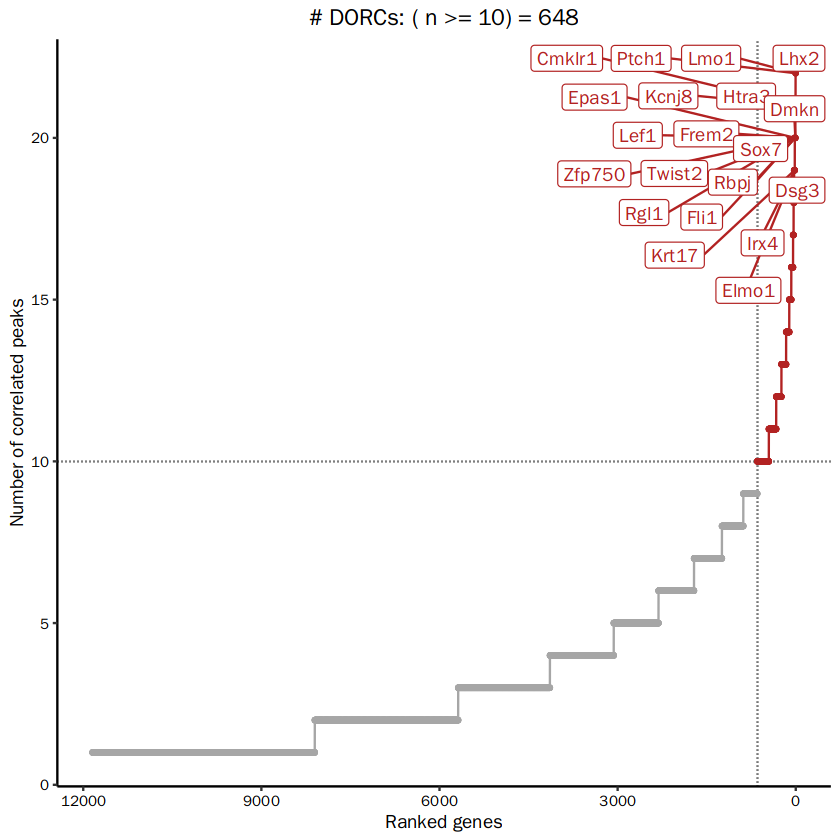

In [5]:
cisCorr.filt <- cisCorr %>% filter(pvalZ <= 0.05)

library(ggplot2)
dorcGenes <- dorcJPlot(dorcTab = cisCorr.filt,
                         cutoff = 10, # No. sig peaks needed to be called a DORC
                         labelTop = 20,
                         returnGeneList = TRUE, # Set this to FALSE for just the plot
                         force=5)

In [6]:
cisCorr.filt

Peak,PeakRanges,Gene,rObs,pvalZ
<dbl>,<chr>,<chr>,<dbl>,<dbl>
108,chr1:4847022-4847356,Lypla1,0.01657230,1.232410e-02
123,chr1:5053634-5053837,Atp6v1h,0.01339152,1.822994e-02
124,chr1:5054591-5054979,Atp6v1h,0.01771621,4.135503e-02
125,chr1:5055366-5056346,Atp6v1h,0.02437610,3.151417e-02
162,chr1:6178683-6179084,Rb1cc1,0.02484384,1.641320e-02
167,chr1:6193549-6193821,Rb1cc1,0.02268875,1.273238e-02
308,chr1:9551752-9552236,Rrs1,0.02859017,2.764364e-02
306,chr1:9547731-9548297,Adhfe1,0.02532719,5.542400e-04
307,chr1:9548660-9549248,Adhfe1,0.01783046,1.248365e-02


In [7]:
# Unfiltered
numDorcs <- cisCorr.filt %>% group_by(Gene) %>% tally() %>% arrange(desc(n))
numDorcs

Gene,n
<chr>,<int>
Lhx2,22
Lmo1,22
Ptch1,22
Cmklr1,21
Htra3,21
Kcnj8,21
Dmkn,20
Epas1,20
Fli1,20


In [8]:
library(readr)

In [9]:
#write_csv(numDorcs, "241208.numDorcs.cutoff10.4_14.csv")

In [10]:
dorcMat <- getDORCScores(ATAC.se = ATAC.se.paired, # Has to be same SE as used in previous step
                         dorcTab = cisCorr.filt,
                         geneList = dorcGenes,
                         nCores = 12)

Running DORC scoring for 648 genes: Lhx2, Lmo1, Ptch1, Cmklr1, Htra3, Kcnj8, Dmkn, Epas1, Fli1, Frem2, Lef1, Rbpj, Rgl1, Sox7, Twist2, Zfp750, Dsg3, Elmo1, Irx4, Krt17, ... , ... , ... (truncated display)



........
Normalizing scATAC counts ..
SummarizedExperiment object input detected .. Centering counts under assayCentering counts for cells sequentially in groups of size  5000  ..

Computing centered counts for cells:  1  to  5000 ..
Computing centered counts per cell using mean reads in features ..

Computing centered counts for cells:  5001  to  10000 ..
Computing centered counts per cell using mean reads in features ..

Computing centered counts for cells:  10001  to  15000 ..
Computing centered counts per cell using mean reads in features ..

Computing centered counts for cells:  15001  to  20000 ..
Computing centered counts per cell using mean reads in features ..

Computing centered counts for cells:  20001  to  25000 ..
Computing centered counts per cell using mean reads in features ..

Computing centered counts for cells:  25001  to  30000 ..
Computing centered counts per cell using mean reads in features ..

Computing centered counts for cells:  30001  to  35000 ..
Computing c

In [11]:
dim(dorcMat)

[1]   648 40814

In [12]:
dorcMat

  [[ suppressing 33 column names 'PD4_ATAC_geni1_ACAAACCGTTTGAAGA-1', 'E18.5_ATAC_geni_CGCGCAAAGGACTAGC-1', 'PD4_ATAC_geni1_GCACGCATCCTAAGTG-1' ... ]]



648 x 40814 sparse Matrix of class "dgCMatrix"
                                                                        
1700016K19Rik  59.84179   .         .         .         .         .     
2310022B05Rik   .        16.78407   .         .         .         .     
2610035D17Rik  19.94726  33.56815   .        50.98026   .         .     
2700046A07Rik   .         .         .         .         .         .     
4930438E09Rik   .         .         .        12.74506   .         .     
4930511E03Rik   .        16.78407   .         .        48.81936   .     
4930523C07Rik  99.73632  16.78407  36.04595  38.23519  48.81936  69.3197
4930544M13Rik  59.84179   .         .         .        97.63872   .     
5430421F17Rik  19.94726   .         .         .        48.81936   .     
a               .         .         .         .         .         .     
A330102I10Rik  19.94726  33.56815  36.04595  25.49013   .         .     
Aatk           19.94726   .         .        25.49013   .         .     
Abca

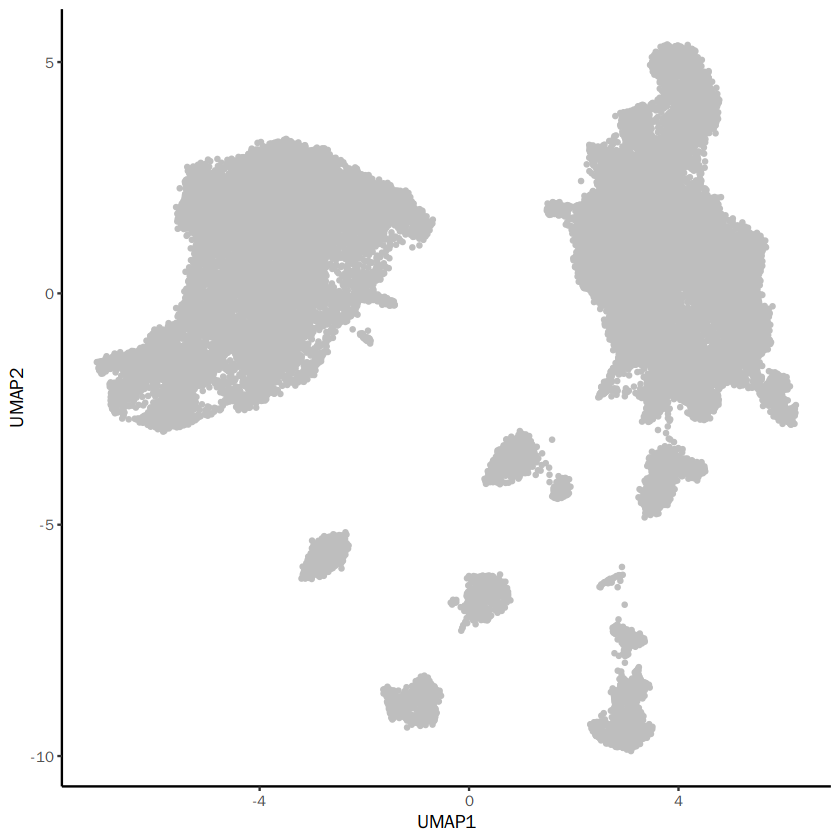

In [13]:
colData(ATAC.se.paired) %>% 
  as.data.frame() %>% 
  ggplot(aes(UMAP1,UMAP2)) + 
  geom_point(color="gray",size=0.8)+ theme_classic()

In [14]:
skin <- readRDS("./RDS/241023.E13_PD4_integrated.2-10.reference.motif.chromvar.newcluster.footprint.rds")

In [15]:
skin

An object of class Seurat 
361458 features across 45406 samples within 3 assays 
Active assay: peaks (338904 features, 338904 variable features)
 2 other assays present: RNA, chromvar
 3 dimensional reductions calculated: lsi, umap, peakvi

In [16]:
peakvi <- Embeddings(skin, reduction = "peakvi")

In [17]:
dim(peakvi)
class(peakvi)

[1] 45406    14

[1] "matrix" "array"

In [18]:
stopifnot(all(colnames(dorcMat) %in% rownames(peakvi)))

In [19]:
# Subset to paired ATAC
peakvi <- peakvi[colnames(dorcMat),]

dim(peakvi)

# Get cell KNNs
cellkNN <- FNN::get.knn(peakvi,k=30)$nn.index
rownames(cellkNN) <- colnames(dorcMat)

[1] 40814    14

In [20]:
class(RNAmat.paired)

[1] "dgCMatrix"
attr(,"package")
[1] "Matrix"

In [21]:
RNAmat.paired

  [[ suppressing 32 column names 'GGTTAACAGATTTGCC-1-5', 'TACAGGTAGCACTTTG-1-5', 'GGTGATTGTCCAGCCA-1-7' ... ]]

  [[ suppressing 32 column names 'GGTTAACAGATTTGCC-1-5', 'TACAGGTAGCACTTTG-1-5', 'GGTGATTGTCCAGCCA-1-7' ... ]]

  [[ suppressing 32 column names 'GGTTAACAGATTTGCC-1-5', 'TACAGGTAGCACTTTG-1-5', 'GGTGATTGTCCAGCCA-1-7' ... ]]



18859 x 40814 sparse Matrix of class "dgCMatrix"
                                                                                   
Xkr4          .         .         0.5486959 .         .         .         0.4960738
Gm1992        .         .         .         .         .         .         .        
Gm19938       .         .         .         .         .         .         .        
Rp1           .         .         .         .         .         .         .        
Sox17         .         .         .         .         .         .         .        
Mrpl15        0.5689774 .         .         0.3890658 0.5009447 0.4084201 0.4960738
Lypla1        0.5689774 .         .         0.3890658 1.0820895 .         0.4960738
Tcea1         0.3244212 1.5434940 0.5486959 0.8865755 1.2812445 0.4084201 0.4960738
Rgs20         .         .         .         .         .         .         .        
Atp6v1h       .         .         0.5486959 0.3890658 .         0.9216035 0.4960738
Npbwr1        .         .  

In [22]:
# Smooth dorc scores using cell KNNs (k=30)
library(doParallel)
dorcMat.s <- smoothScoresNN(NNmat = cellkNN,mat = dorcMat,nCores = 12)

필요한 패키지를 로딩중입니다: foreach

필요한 패키지를 로딩중입니다: iterators

필요한 패키지를 로딩중입니다: parallel



Number of cells in supplied matrix:  40814 
Number of genes in supplied matrix:  648 
Number of nearest neighbors being used per cell for smoothing:  30 
  |                                                                      |   0%Running in parallel using  12 cores ..
  |======================================================================| 100%
Merging results ..

Time Elapsed:  11.9739608168602 mins 


In [23]:
# Smooth RNA using cell KNNs
# This takes longer since it's all genes
colnames(RNAmat.paired) <- colnames(ATAC.se.paired) # Just so that the smoothing function doesn't throw an error (matching cell barcodes in the KNN and the matrix)
RNAmat.s <- smoothScoresNN(NNmat = cellkNN,mat = RNAmat.paired,nCores = 12)

Number of cells in supplied matrix:  40814 
Number of genes in supplied matrix:  18859 
Number of nearest neighbors being used per cell for smoothing:  30 
Running smoothing for all genes in matrix! (n = 18859) This is bound to take more time than querying specific markers ..
  |                                                                      |   0%Running in parallel using  12 cores ..
  |======================================================================| 100%
Merging results ..

Time Elapsed:  20.2048202236493 mins 


In [24]:
dorcMat.s

  [[ suppressing 33 column names 'PD4_ATAC_geni1_ACAAACCGTTTGAAGA-1', 'E18.5_ATAC_geni_CGCGCAAAGGACTAGC-1', 'PD4_ATAC_geni1_GCACGCATCCTAAGTG-1' ... ]]



648 x 40814 sparse Matrix of class "dgCMatrix"
                                                                         
1700016K19Rik  21.6314764  23.1599427   8.6334382  17.6664666  13.8706131
2310022B05Rik   1.9371943   3.1281273   1.9133973   1.9346843   3.8730092
2610035D17Rik  21.8958087  53.5361833  48.9768784  32.0191558  22.9098684
2700046A07Rik   7.1737942   6.0991657   2.9812984   8.0075972   3.8638119
4930438E09Rik   1.2993019   1.9989938   1.1718672   1.3193179   .        
4930511E03Rik   0.6605929   7.9437798   6.6406867   8.6314448   .        
4930523C07Rik  41.3832298  19.4160472  59.9640478  33.9843574  55.2977099
4930544M13Rik  11.3633039  43.5944951  33.6218106  47.9133903  25.4117737
5430421F17Rik  22.1034657   4.5507571   5.3711066   4.3981666  23.2848517
a               1.9521254   1.5967595   0.7966714   0.8255700   1.4994425
A330102I10Rik   5.5269815  27.2643961  25.5517473  33.7540095  12.5397139
Aatk            5.4447416   4.8244396   2.0938342   3.3735856   4

In [25]:
cells_in_dorcMat <- colnames(dorcMat.s)

# Subset the Seurat object to include only these cells
skin_subset <- subset(skin, cells = cells_in_dorcMat)
print(dim(skin_subset))
print(length(cells_in_dorcMat))

[1] 338904  40814
[1] 40814


In [26]:
dorc_matrix <- as.matrix(dorcMat.s)

In [27]:
dorc_matrix

,PD4_ATAC_geni1_ACAAACCGTTTGAAGA-1,E18.5_ATAC_geni_CGCGCAAAGGACTAGC-1,PD4_ATAC_geni1_GCACGCATCCTAAGTG-1,E16.5_ATAC_TCACTCGTCGGTCTCT-1,PD2_ATAC_geni1_GCGGTGTAGGTTAACA-1,PD2_ATAC_geni1_AGTCAACCACATGATC-1,E18.5_ATAC_geni_GTTACTTGTAGAAAGG-1,PD4_ATAC_geni2_ACCCAAAAGTCATCTG-1,PD2_ATAC_geni1_GGTGCTGTCTGCTACC-1,PD2_ATAC_geni2_GCGTAGCCAACAACTC-1,⋯,PD0_ATAC_GMI2_GCGGGTTGTGGAAAGA-1,E13.5_ATAC_ATGTTTCAGCACGTAG-1,PD0_ATAC_GMI1_GAACCGCCATTCTCGC-1,E13.5_ATAC_GCTCGAGCATCAGCTA-1,E13.5_ATAC_AAAGGGCTCGAGTTAC-1,E13.5_ATAC_TGTACGATCAAACCCA-1,PD4_ATAC_geni1_TCTAGTTGTGCCCGAT-1,E16.5_ATAC_TGGGTTAGTAACCCAT-1,E18.5_ATAC_geni_ACAATCGAGTAGGTCG-1,E13.5_ATAC_CAAAGCTCACGGCCAT-1
1700016K19Rik,21.6314764,23.1599427,8.6334382,17.666467,13.870613,16.794213,9.7606710,9.1813448,17.5539598,17.642809,⋯,2.7292985,9.0835008,7.7132149,10.2030832,3.767987,16.1204221,4.403949,6.6316373,7.3094531,8.5264171
2310022B05Rik,1.9371943,3.1281273,1.9133973,1.934684,3.873009,4.567849,1.5967208,0.7351816,2.0012046,9.238037,⋯,14.0591946,13.6914047,13.2701321,16.6572613,7.343575,7.2279444,11.376403,18.8583591,13.7611552,9.3217110
2610035D17Rik,21.8958087,53.5361833,48.9768784,32.019156,22.909868,42.437652,35.1923081,16.7071982,36.8891139,51.386454,⋯,5.8534651,9.0768437,14.9063492,6.1858884,10.918973,5.4820250,8.856686,2.2569436,9.9220170,5.4489312
2700046A07Rik,7.1737942,6.0991657,2.9812984,8.007597,3.863812,1.664967,4.2628656,6.0826651,6.7976728,9.033590,⋯,18.3900911,10.4742384,17.2192914,31.1376513,17.859472,15.4020916,17.051545,12.1803439,8.1366778,23.0276904
4930438E09Rik,1.2993019,1.9989938,1.1718672,1.319318,0.000000,1.025676,0.7528690,0.7351816,0.0000000,0.000000,⋯,1.3446971,5.7042101,2.8898371,4.1677122,3.175712,3.1810793,4.198815,3.5693926,5.6096850,5.1325005
4930511E03Rik,0.6605929,7.9437798,6.6406867,8.631445,0.000000,0.000000,2.6737943,5.1270725,1.6060279,8.272495,⋯,2.3345846,7.2165580,3.6958466,4.9505976,1.634091,2.7089487,5.522334,20.5529892,3.5930633,3.3920971
4930523C07Rik,41.3832298,19.4160472,59.9640478,33.984357,55.297710,86.790834,74.3150283,21.0477410,42.2764022,12.405192,⋯,0.0000000,6.0032260,5.5012154,1.7249598,4.270599,3.5263551,4.153743,7.5421791,4.1861545,9.6891695
4930544M13Rik,11.3633039,43.5944951,33.6218106,47.913390,25.411774,45.402509,19.5250605,12.1528111,53.9388892,51.263683,⋯,0.5119318,1.2314503,1.5201752,1.0251669,1.469598,1.0494041,0.000000,1.3340794,0.0000000,1.2183541
5430421F17Rik,22.1034657,4.5507571,5.3711066,4.398167,23.284852,0.000000,1.7934158,6.2807368,1.6602891,1.528078,⋯,2.1640115,5.2670575,5.2543036,7.1858108,2.771188,3.2464531,4.921542,53.5868359,1.5616633,5.5747440
a,1.9521254,1.5967595,0.7966714,0.825570,1.499443,0.000000,0.9090529,0.0000000,2.5994994,1.576584,⋯,3.9686288,4.2869147,2.6856695,12.5145753,11.495233,11.6641042,5.965831,18.5853285,1.9135016,13.6787252


In [28]:
skin_subset

An object of class Seurat 
361458 features across 40814 samples within 3 assays 
Active assay: peaks (338904 features, 338904 variable features)
 2 other assays present: RNA, chromvar
 3 dimensional reductions calculated: lsi, umap, peakvi

In [29]:
dorc_assay <- CreateAssayObject(counts = dorc_matrix)

In [30]:
skin_subset[["DORC"]] <- dorc_assay  # Add DORC assay to the Seurat object

In [31]:
# Step 2: Set the default assay to DORC
DefaultAssay(skin_subset) <- "DORC"

In [32]:
skin_subset[["DORC"]]

Assay data with 648 features for 40814 cells
First 10 features:
 1700016K19Rik, 2310022B05Rik, 2610035D17Rik, 2700046A07Rik,
4930438E09Rik, 4930511E03Rik, 4930523C07Rik, 4930544M13Rik,
5430421F17Rik, a 

In [ ]:
Idents(skin_subset) <- "label" 

In [34]:
Idents(skin_subset)

PD4_ATAC_geni1_ACAAACCGTTTGAAGA-1 E18.5_ATAC_geni_CGCGCAAAGGACTAGC-1 
                            HFKC-2                               BK-1 
 PD4_ATAC_geni1_GCACGCATCCTAAGTG-1      E16.5_ATAC_TCACTCGTCGGTCTCT-1 
                              BK-1                               BK-1 
 PD2_ATAC_geni1_GCGGTGTAGGTTAACA-1  PD2_ATAC_geni1_AGTCAACCACATGATC-1 
                            HFKC-2                               BK-1 
E18.5_ATAC_geni_GTTACTTGTAGAAAGG-1  PD4_ATAC_geni2_ACCCAAAAGTCATCTG-1 
                               SBK                             HFKC-2 
 PD2_ATAC_geni1_GGTGCTGTCTGCTACC-1  PD2_ATAC_geni2_GCGTAGCCAACAACTC-1 
                              BK-1                               BK-1 
 PD4_ATAC_geni2_TGATTTCTCGAGCGCT-1  PD2_ATAC_geni1_TACTAGGAGGGAGTTC-1 
                            HFKC-3                              HP/HG 
E18.5_ATAC_geni_AGCTGATAGAAGCCTG-1  E18.5_ATAC_GMI_GGATGAGCAAGATGCG-1 
                              BK-2                               BK-2 
  PD0_ATAC_GMI1_TGATTTCAGAAAGGGT-1  PD2_ATAC_geni1_GCCAGCACAATTCGTG-1 
                              BK-1                                SBK 
 PD2_ATAC_geni1_GTGCCAGCACACTAGT-1  E18.5_ATAC_GMI_CATGTTTGTTAGAGAT-1 
                              BK-1                               BK-1 
E18.5_ATAC_geni_GCGATTATCGCTTACC-1  E18.5_ATAC_GMI_AATACGCAGTTCGTTG-1 
                               SBK                                SBK 
 PD4_ATAC_geni1_TACAGCAGTAACGGCA-1   PD0_ATAC_GMI1_CCCACATTCTGCGTCT-1 
                              BK-2                              HP/HG 
E18.5_ATAC_geni_TATGTTCCATGCTATG-1   PD0_ATAC_GMI1_TGCTCGTAGTCGTACT-1 
                             HP/HG                               BK-1 
  PD0_ATAC_GMI2_TACTGCCAGATATGTG-1  PD2_ATAC_geni2_TCACAAGGTCAACTAC-1 
                            HFKC-1                                SBK 
E18.5_ATAC_geni_TTTACGTTCAGGAATA-1  PD2_ATAC_geni1_ACAGGCCGTATCCTTT-1 
                            HFKC-2                               BK-1 
 PD2_ATAC_geni2_TTACGGATCCTCTCTT-1  PD4_ATAC_geni2_CACAACAAGAGGCCTA-1 
                              BK-1                             HFKC-1 
  PD0_ATAC_GMI2_AACCTTTGTACAAATG-1 E18.5_ATAC_geni_TAGGTGTTCTGCGTCT-1 
                              BK-2                                SBK 
  PD0_ATAC_GMI1_AGCCTCTGTATGTCCA-1  PD2_ATAC_geni1_AGCCCGAAGATCTCAC-1 
                            HFKC-1                               BK-1 
 E18.5_ATAC_GMI_GTGCACGGTGTCTCGG-1 E18.5_ATAC_geni_TTAGGTGTCGCCGAAC-1 
                              BK-2                              HP/HG 
 E18.5_ATAC_GMI_CCAGAATCACGCCGAT-1   PD0_ATAC_GMI1_AGTGCCGCACCACAGC-1 
                             HP/HG                               BK-1 
 E18.5_ATAC_GMI_TTGGTCCCAGTTCGGC-1  PD4_ATAC_geni2_TTTGTGTCAAACGACG-1 
                             HP/HG                               BK-1 
  PD0_ATAC_GMI2_TATCTGTAGCGTATCT-1  E18.5_ATAC_GMI_GAAGTGGAGGTGTCGA-1 
                             HP/HG                             HFKC-1 
 PD2_ATAC_geni1_GTGATCAGTCCAAGAG-1  PD4_ATAC_geni1_GCTCACTCACAAACAA-1 
                              BK-1                               BK-2 
 PD2_ATAC_geni1_TAGACTGTCTGATCCC-1  E18.5_ATAC_GMI_TCTAGTTCAAAGGAAG-1 
                               SBK                              HP/HG 
  PD0_ATAC_GMI2_CTTCCAGCATCCTGGG-1  PD2_ATAC_geni2_CTAGGATGTAGTACAA-1 
                              BK-1                                SBK 
 PD2_ATAC_geni1_GGCGAAACAGGGTAAC-1 E18.5_ATAC_geni_AGCCCGATCGGTCCGA-1 
                              BK-1                               BK-1 
 PD2_ATAC_geni1_TCGGGACCATGGAGGT-1  PD2_ATAC_geni2_GGTTGCGAGGCAATTA-1 
                              BK-1                                SBK 
  PD0_ATAC_GMI1_GAGTGAGCATTACACG-1  PD2_ATAC_geni1_GGATGAGTCGGCTATA-1 
                               SBK                               BK-1 
  PD0_ATAC_GMI2_GCGATTATCGTATAGC-1 E18.5_ATAC_geni_ACATGCATCCACCTAC-1 
                            HFKC-2                                SBK 
 PD2_ATAC_geni2_GGGAACATC

In [ ]:
custom_order <- c("emFIB-1", "emFIB-2", "FIB-1", "FIB-2", "FIB-3", "FIB-4", "FIB-5", 
                  "Pre-adipo", "DS", "DC/DP", "DP", "APM", "Chond", "emK", 
                  "HP/HG", "HFKC-1", "HFKC-2", "HFKC-3", "HFSBK-1", "HFSBK-2", 
                  "BK-1", "BK-2", "SBK", "Immune", "Macrophage", "Merkel", 
                  "Muscle", "Pericyte", "Schwann", "Melanocyte", "VEC", "LEC", "UD")
Idents(skin_subset) <- factor(Idents(skin_subset), levels = custom_order)

In [36]:
Idents(skin_subset)

PD4_ATAC_geni1_ACAAACCGTTTGAAGA-1 E18.5_ATAC_geni_CGCGCAAAGGACTAGC-1 
                            HFKC-2                               BK-1 
 PD4_ATAC_geni1_GCACGCATCCTAAGTG-1      E16.5_ATAC_TCACTCGTCGGTCTCT-1 
                              BK-1                               BK-1 
 PD2_ATAC_geni1_GCGGTGTAGGTTAACA-1  PD2_ATAC_geni1_AGTCAACCACATGATC-1 
                            HFKC-2                               BK-1 
E18.5_ATAC_geni_GTTACTTGTAGAAAGG-1  PD4_ATAC_geni2_ACCCAAAAGTCATCTG-1 
                               SBK                             HFKC-2 
 PD2_ATAC_geni1_GGTGCTGTCTGCTACC-1  PD2_ATAC_geni2_GCGTAGCCAACAACTC-1 
                              BK-1                               BK-1 
 PD4_ATAC_geni2_TGATTTCTCGAGCGCT-1  PD2_ATAC_geni1_TACTAGGAGGGAGTTC-1 
                            HFKC-3                              HP/HG 
E18.5_ATAC_geni_AGCTGATAGAAGCCTG-1  E18.5_ATAC_GMI_GGATGAGCAAGATGCG-1 
                              BK-2                               BK-2 
  PD0_ATAC_GMI1_TGATTTCAGAAAGGGT-1  PD2_ATAC_geni1_GCCAGCACAATTCGTG-1 
                              BK-1                                SBK 
 PD2_ATAC_geni1_GTGCCAGCACACTAGT-1  E18.5_ATAC_GMI_CATGTTTGTTAGAGAT-1 
                              BK-1                               BK-1 
E18.5_ATAC_geni_GCGATTATCGCTTACC-1  E18.5_ATAC_GMI_AATACGCAGTTCGTTG-1 
                               SBK                                SBK 
 PD4_ATAC_geni1_TACAGCAGTAACGGCA-1   PD0_ATAC_GMI1_CCCACATTCTGCGTCT-1 
                              BK-2                              HP/HG 
E18.5_ATAC_geni_TATGTTCCATGCTATG-1   PD0_ATAC_GMI1_TGCTCGTAGTCGTACT-1 
                             HP/HG                               BK-1 
  PD0_ATAC_GMI2_TACTGCCAGATATGTG-1  PD2_ATAC_geni2_TCACAAGGTCAACTAC-1 
                            HFKC-1                                SBK 
E18.5_ATAC_geni_TTTACGTTCAGGAATA-1  PD2_ATAC_geni1_ACAGGCCGTATCCTTT-1 
                            HFKC-2                               BK-1 
 PD2_ATAC_geni2_TTACGGATCCTCTCTT-1  PD4_ATAC_geni2_CACAACAAGAGGCCTA-1 
                              BK-1                             HFKC-1 
  PD0_ATAC_GMI2_AACCTTTGTACAAATG-1 E18.5_ATAC_geni_TAGGTGTTCTGCGTCT-1 
                              BK-2                                SBK 
  PD0_ATAC_GMI1_AGCCTCTGTATGTCCA-1  PD2_ATAC_geni1_AGCCCGAAGATCTCAC-1 
                            HFKC-1                               BK-1 
 E18.5_ATAC_GMI_GTGCACGGTGTCTCGG-1 E18.5_ATAC_geni_TTAGGTGTCGCCGAAC-1 
                              BK-2                              HP/HG 
 E18.5_ATAC_GMI_CCAGAATCACGCCGAT-1   PD0_ATAC_GMI1_AGTGCCGCACCACAGC-1 
                             HP/HG                               BK-1 
 E18.5_ATAC_GMI_TTGGTCCCAGTTCGGC-1  PD4_ATAC_geni2_TTTGTGTCAAACGACG-1 
                             HP/HG                               BK-1 
  PD0_ATAC_GMI2_TATCTGTAGCGTATCT-1  E18.5_ATAC_GMI_GAAGTGGAGGTGTCGA-1 
                             HP/HG                             HFKC-1 
 PD2_ATAC_geni1_GTGATCAGTCCAAGAG-1  PD4_ATAC_geni1_GCTCACTCACAAACAA-1 
                              BK-1                               BK-2 
 PD2_ATAC_geni1_TAGACTGTCTGATCCC-1  E18.5_ATAC_GMI_TCTAGTTCAAAGGAAG-1 
                               SBK                              HP/HG 
  PD0_ATAC_GMI2_CTTCCAGCATCCTGGG-1  PD2_ATAC_geni2_CTAGGATGTAGTACAA-1 
                              BK-1                                SBK 
 PD2_ATAC_geni1_GGCGAAACAGGGTAAC-1 E18.5_ATAC_geni_AGCCCGATCGGTCCGA-1 
                              BK-1                               BK-1 
 PD2_ATAC_geni1_TCGGGACCATGGAGGT-1  PD2_ATAC_geni2_GGTTGCGAGGCAATTA-1 
                              BK-1                                SBK 
  PD0_ATAC_GMI1_GAGTGAGCATTACACG-1  PD2_ATAC_geni1_GGATGAGTCGGCTATA-1 
                               SBK                               BK-1 
  PD0_ATAC_GMI2_GCGATTATCGTATAGC-1 E18.5_ATAC_geni_ACATGCATCCACCTAC-1 
                            HFKC-2                                SBK 
 PD2_ATAC_geni2_GGGAACATC

In [37]:
skin_subset <- NormalizeData(skin_subset, normalization.method = "LogNormalize", scale.factor = 10000)

In [38]:
skin_subset <- ScaleData(skin_subset)

Centering and scaling data matrix



In [ ]:
all_dorc_diff_log <- FindAllMarkers(skin_subset, test.use = "wilcox", only.pos=TRUE)
head(all_dorc_diff_log)

In [41]:
library(dplyr)


top_dorcs_per_cluster <- all_dorc_diff_log %>%
  group_by(cluster) %>%
  arrange(p_val_adj, .by_group = TRUE) %>%  
  slice_head(n = 3) 

# Display the result
top_dorcs_per_cluster

p_val,avg_log2FC,pct.1,pct.2,p_val_adj,cluster,gene
<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<fct>,<chr>
0.000000e+00,2.256300,1.000,0.894,0.000000e+00,emFIB-1,Pgbd5
0.000000e+00,1.699848,1.000,0.980,0.000000e+00,emFIB-1,Zic1
0.000000e+00,1.618049,1.000,0.854,0.000000e+00,emFIB-1,Tac1
0.000000e+00,1.984977,1.000,0.969,0.000000e+00,emFIB-2,Zfhx4
0.000000e+00,1.984794,1.000,0.929,0.000000e+00,emFIB-2,Meg3
0.000000e+00,1.819662,1.000,0.979,0.000000e+00,emFIB-2,C530044C16Rik
0.000000e+00,1.871842,1.000,0.946,0.000000e+00,FIB-1,4930511E03Rik
0.000000e+00,1.868583,1.000,0.943,0.000000e+00,FIB-1,D630003M21Rik
0.000000e+00,1.864537,1.000,0.925,0.000000e+00,FIB-1,Gsg1l


In [42]:
agg <- AverageExpression(skin_subset, 
                         assay = "DORC", 
                         return.seurat = TRUE, 
                         )

Centering and scaling data matrix



In [43]:
head(agg[['DORC']]@data)

,emFIB-1,emFIB-2,FIB-1,FIB-2,FIB-3,FIB-4,FIB-5,Pre-adipo,DS,DC/DP,⋯,Immune,Macrophage,Merkel,Muscle,Pericyte,Schwann,Melanocyte,VEC,LEC,UD
1700016K19Rik,2.412078,2.460925,2.277000,2.2251286,2.132339,2.172118,2.213908,2.175558,2.393590,2.399314,⋯,3.2624737,2.1290200,3.039283,2.702098,1.996912,2.305921,2.675716,2.9772913,2.8810123,1.44006247
2310022B05Rik,3.578544,3.170484,3.847216,4.0610832,3.393859,2.625209,3.538560,2.116035,3.500061,3.261557,⋯,1.1387081,1.5526551,1.386961,3.327587,3.331767,2.795095,2.415075,2.2148952,2.1340709,0.84028835
2610035D17Rik,1.522680,1.621246,1.044277,0.9631691,1.200759,0.985565,1.170145,1.175258,1.215700,1.388542,⋯,1.8895934,0.9829073,2.857228,1.803800,1.266504,2.253806,3.089306,2.3994181,1.4294992,0.05418802
2700046A07Rik,3.141997,2.587089,3.289832,3.0844380,2.932573,2.150938,3.175765,2.373090,2.913139,3.878998,⋯,0.9547373,1.3753450,2.922851,2.683070,2.719456,3.019864,2.733079,3.2667151,1.9593248,0.79360644
4930438E09Rik,1.984913,2.435693,1.339735,1.2589787,2.511166,3.019779,2.259707,3.421453,1.937421,1.424714,⋯,0.6895695,0.4442414,1.657540,2.065424,3.852091,1.601721,1.629695,0.8319633,0.8656898,0.10793913
4930511E03Rik,3.478162,2.537113,3.957286,3.9005836,2.849550,1.655547,3.169577,1.421487,3.299244,2.711317,⋯,0.9723993,1.0262452,2.093734,2.796753,1.046231,1.709248,1.536037,0.5478377,1.4338363,0.01750178


In [44]:
head(agg[['DORC']]@scale.data)

,emFIB-1,emFIB-2,FIB-1,FIB-2,FIB-3,FIB-4,FIB-5,Pre-adipo,DS,DC/DP,⋯,Immune,Macrophage,Merkel,Muscle,Pericyte,Schwann,Melanocyte,VEC,LEC,UD
1700016K19Rik,-0.2367665,-0.1098980,-0.5875935,-0.7223165,-0.9633125,-0.8599973,-0.7514597,-0.851062201,-0.2847830,-0.26991660,⋯,1.9719091,-0.9719329,1.3922316,0.5164832,-1.3150491,-0.5124808,0.4479646,1.23122432,0.9811654,-2.761315
2310022B05Rik,1.2218495,0.8434123,1.4710182,1.6693599,1.0505714,0.3377205,1.1847689,-0.134490150,1.1490647,0.92787404,⋯,-1.0408698,-0.6569727,-0.8106380,0.9891108,0.9929873,0.4952744,0.1428410,-0.04280689,-0.1177638,-1.317626
2610035D17Rik,-0.5052316,-0.4061349,-0.9862119,-1.0677565,-0.8288867,-1.0452400,-0.8596661,-0.854525628,-0.8138654,-0.64009228,⋯,-0.1363423,-1.0479120,0.8365045,-0.2225980,-0.7627878,0.2298320,1.0698326,0.37622851,-0.5989146,-1.981634
2700046A07Rik,1.0122663,0.2791404,1.2075817,0.9362217,0.7355824,-0.2970887,1.0568804,-0.003588528,0.7099068,1.98596838,⋯,-1.8774697,-1.3217764,0.7227386,0.4059479,0.4540196,0.8509091,0.4720174,1.17704036,-0.5502413,-2.090350
4930438E09Rik,0.5540222,1.0175622,-0.1094192,-0.1924611,1.0951720,1.6181830,0.8365954,2.031226385,0.5051858,-0.02203417,⋯,-0.7779886,-1.0302612,0.2173828,0.6368126,2.4740552,0.1599836,0.1887490,-0.63156403,-0.5968829,-1.376083
4930511E03Rik,1.5474088,0.5959987,2.0318092,1.9744822,0.9118757,-0.2952748,1.2354259,-0.531912372,1.3665209,0.77212067,⋯,-0.9859448,-0.9315060,0.1477371,0.8584971,-0.9113002,-0.2409826,-0.4161013,-1.41518128,-0.5194268,-1.951357


In [45]:
head(agg[['DORC']]@counts) 

  [[ suppressing 33 column names 'emFIB-1', 'emFIB-2', 'FIB-1' ... ]]



6 x 33 sparse Matrix of class "dgCMatrix"
                                                                         
1700016K19Rik 10.157118 10.715647  8.747398  8.254673  7.434573  7.776854
2310022B05Rik 34.821332 22.819008 45.862423 57.037143 28.780641 12.807455
2610035D17Rik  3.584497  4.059391  1.841343  1.619986  2.322639  1.679325
2700046A07Rik 22.150042 12.291025 25.838356 20.855180 17.775875  7.592911
4930438E09Rik  6.278413 10.423728  2.818030  2.521823 11.319285 19.486774
4930511E03Rik 31.400105 11.643124 51.315167 48.431291 16.280008  4.235943
                                                                         
1700016K19Rik  8.151408  7.807101  9.952745 10.015618  8.256846 13.083199
2310022B05Rik 33.417338  7.298173 32.117489 25.090126 16.361683 52.100463
2610035D17Rik  2.222459  2.238977  2.372654  3.009001  2.204647  3.185249
2700046A07Rik 22.945139  9.730495 17.414508 47.375711 27.519838 14.333531
4930438E09Rik  8.580286 29.613856  5.940826  3.156669  4.511057  4.603

In [46]:
agg_cvar <- agg

In [47]:
agg_cvar

An object of class Seurat 
648 features across 33 samples within 1 assay 
Active assay: DORC (648 features, 0 variable features)

In [48]:
agg_cvar_counts <- GetAssayData(object = agg_cvar, assay = "DORC", slot = "data")

In [49]:
agg_cvar_counts

,emFIB-1,emFIB-2,FIB-1,FIB-2,FIB-3,FIB-4,FIB-5,Pre-adipo,DS,DC/DP,⋯,Immune,Macrophage,Merkel,Muscle,Pericyte,Schwann,Melanocyte,VEC,LEC,UD
1700016K19Rik,2.4120777,2.460925,2.2770004,2.2251286,2.132339,2.172118,2.2139078,2.1755583,2.3935901,2.3993140,⋯,3.2624737,2.1290200,3.039283,2.702098,1.9969116,2.3059207,2.6757165,2.9772913,2.8810123,1.44006247
2310022B05Rik,3.5785436,3.170484,3.8472161,4.0610832,3.393859,2.625209,3.5385605,2.1160353,3.5000615,3.2615569,⋯,1.1387081,1.5526551,1.386961,3.327587,3.3317670,2.7950952,2.4150748,2.2148952,2.1340709,0.84028835
2610035D17Rik,1.5226803,1.621246,1.0442769,0.9631691,1.200759,0.985565,1.1701447,1.1752576,1.2157001,1.3885422,⋯,1.8895934,0.9829073,2.857228,1.803800,1.2665039,2.2538059,3.0893063,2.3994181,1.4294992,0.05418802
2700046A07Rik,3.1419966,2.587089,3.2898321,3.0844380,2.932573,2.150938,3.1757653,2.3730897,2.9131388,3.8789979,⋯,0.9547373,1.3753450,2.922851,2.683070,2.7194562,3.0198643,2.7330788,3.2667151,1.9593248,0.79360644
4930438E09Rik,1.9849128,2.435693,1.3397346,1.2589787,2.511166,3.019779,2.2597074,3.4214527,1.9374208,1.4247141,⋯,0.6895695,0.4442414,1.657540,2.065424,3.8520913,1.6017213,1.6296949,0.8319633,0.8656898,0.10793913
4930511E03Rik,3.4781617,2.537113,3.9572863,3.9005836,2.849550,1.655547,3.1695766,1.4214868,3.2992438,2.7113173,⋯,0.9723993,1.0262452,2.093734,2.796753,1.0462309,1.7092480,1.5360365,0.5478377,1.4338363,0.01750178
4930523C07Rik,2.4872524,2.172930,2.4536453,2.7243982,2.549631,2.512216,2.1153215,2.5236694,2.6553161,2.3410544,⋯,3.5028713,2.8407842,3.362071,1.883617,2.5841494,1.6399350,1.7038302,2.6050828,2.4981358,3.38852035
4930544M13Rik,0.8699791,1.202318,0.9225508,0.7064709,1.215825,1.170561,1.4074148,1.2988751,0.8490334,0.9484213,⋯,0.7901810,0.5664309,1.302762,0.973298,1.2220373,0.6572418,0.9219122,0.8047342,1.0953408,0.01586486
5430421F17Rik,4.2758049,3.800879,4.0611315,4.0811899,3.630022,3.027734,3.9353321,2.8982843,3.4602939,4.3846190,⋯,2.1772453,1.5760661,1.710866,3.092312,2.6558411,1.6897298,1.7296012,1.7086014,2.0395148,0.25857061
a,3.5881418,2.837963,3.7311576,3.8602541,3.355518,2.424440,3.4546107,2.2385529,2.5339619,3.8193205,⋯,1.9852176,1.1585059,1.262377,2.765099,2.1965743,2.3090843,1.8393410,1.1134741,0.6025001,0.18034461


In [ ]:
#DORC scores

In [50]:
Average_motif<-as.data.frame(agg_cvar_counts)

In [51]:
top_dorcs_per_cluster

p_val,avg_log2FC,pct.1,pct.2,p_val_adj,cluster,gene
<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<fct>,<chr>
0.000000e+00,2.256300,1.000,0.894,0.000000e+00,emFIB-1,Pgbd5
0.000000e+00,1.699848,1.000,0.980,0.000000e+00,emFIB-1,Zic1
0.000000e+00,1.618049,1.000,0.854,0.000000e+00,emFIB-1,Tac1
0.000000e+00,1.984977,1.000,0.969,0.000000e+00,emFIB-2,Zfhx4
0.000000e+00,1.984794,1.000,0.929,0.000000e+00,emFIB-2,Meg3
0.000000e+00,1.819662,1.000,0.979,0.000000e+00,emFIB-2,C530044C16Rik
0.000000e+00,1.871842,1.000,0.946,0.000000e+00,FIB-1,4930511E03Rik
0.000000e+00,1.868583,1.000,0.943,0.000000e+00,FIB-1,D630003M21Rik
0.000000e+00,1.864537,1.000,0.925,0.000000e+00,FIB-1,Gsg1l


In [52]:
key_motifs<-unique(c(top_dorcs_per_cluster$gene))

In [53]:
key_motifs

[1] "Pgbd5"         "Zic1"          "Tac1"          "Zfhx4"        
 [5] "Meg3"          "C530044C16Rik" "4930511E03Rik" "D630003M21Rik"
 [9] "Gsg1l"         "Msra"          "Cacna1a"       "Lrrc18"       
[13] "Fabp4"         "Adgrd1"        "Icosl"         "Kcnj8"        
[17] "Col6a6"        "Cilp"          "Tshz2"         "Cgnl1"        
[21] "Plac8"         "Foxs1"         "Ebf2"          "Rin3"         
[25] "Cmklr1"        "Dock9"         "Enpp2"         "Sox18"        
[29] "Lamc3"         "Fgf7"          "Alpl"          "Myocd"        
[33] "Ednrb"         "Ttll7"         "Bmper"         "Plce1"        
[37] "Wnt7a"         "Wnt3"          "1700016K19Rik" "Tll1"         
[41] "Has3"          "Edar"          "Gm973"         "Col4a3"       
[45] "Sema3e"        "Nek2"          "Cdc14a"        "Slc23a2"      
[49] "Gtf2ird1"      "Myh14"         "BC016579"      "Fam160a1"     
[53] "Krt79"         "Gpam"          "Sdr42e1"       "Acsbg1"       
[57] "Serpinb2"      "Stfa3"         "Serpinb7"      "4930544M13Rik"
[61] "Pthlh"         "Serpina9"      "Sprr1a"        "Cyp4f39"      
[65] "Dusp22"        "Samsn1"        "Gpr65"         "Il4"          
[69] "Mrc1"          "Pik3ap1"       "Nrros"         "Slc35d3"      
[73] "Cyfip2"        "Myog"          "Spsb4"         "Pitx2"        
[77] "Mrvi1"         "Abcc9"         "Sox10"         "Opcml"        
[81] "Me3"           "Mgat5"         "St3gal5"       "Ptprb"        
[85] "Vwf"           "Gm32688"       "Flt4"          "Prox1"        
[89] "Myzap"         "Sla"

In [54]:
forplot3<-Average_motif[key_motifs,]

In [55]:
library(pheatmap)

In [56]:
options(repr.plot.width = 5, repr.plot.height = 6, repr.plot.res = 300)

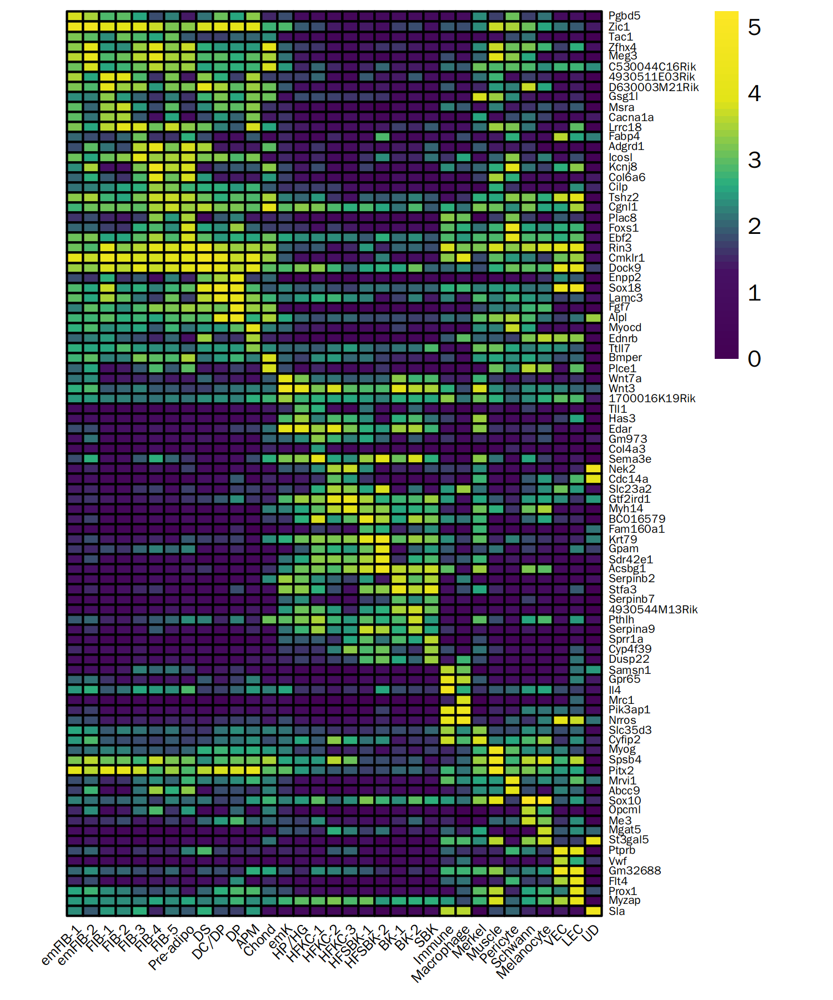

In [57]:
# Custom function to create italicized labels
custom_italics <- function(labels) {
  sapply(labels, function(label) as.expression(bquote(italic(.(label)))))
}

# Generate the heatmap with properly italicized row labels
heatmap_grob <- pheatmap(
  forplot3,
  #color = hcl.colors(50, "inferno"), 
  color = colorRampPalette(c("#440154ff", "#471164ff", "#27ad81ff", "#e3e418ff", "#fde725ff"))(50),  # Define the color palette
  cluster_rows = FALSE,  # Don't cluster rows, use the sorted order
  cluster_cols = FALSE,  # Don't cluster columns, use the custom order
  #scale = "row",         # Optionally scale the data by rows
  border_color = 'black',
  angle_col = 45,        # Rotate column labels by 45 degrees
  show_rownames = TRUE,  # Display row names
  fontsize_row = 5,     # Adjust row label font size
  fontsize_col = 6,
  cellwidth = 7,  # Adjust cell width to prevent overlap
  #breaks = seq(from=-2, to=2, length.out=50), # max and min scale bar
  labels_row = custom_italics(rownames(forplot3))  # Italicize row names
)

ggsave("./Fig4_rxiv/241108.drocsmoothe.heatmap.svg", plot=heatmap_grob, width =5, height =6, units = 'in')

In [58]:
top_dorcs_per_cluster

p_val,avg_log2FC,pct.1,pct.2,p_val_adj,cluster,gene
<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<fct>,<chr>
0.000000e+00,2.256300,1.000,0.894,0.000000e+00,emFIB-1,Pgbd5
0.000000e+00,1.699848,1.000,0.980,0.000000e+00,emFIB-1,Zic1
0.000000e+00,1.618049,1.000,0.854,0.000000e+00,emFIB-1,Tac1
0.000000e+00,1.984977,1.000,0.969,0.000000e+00,emFIB-2,Zfhx4
0.000000e+00,1.984794,1.000,0.929,0.000000e+00,emFIB-2,Meg3
0.000000e+00,1.819662,1.000,0.979,0.000000e+00,emFIB-2,C530044C16Rik
0.000000e+00,1.871842,1.000,0.946,0.000000e+00,FIB-1,4930511E03Rik
0.000000e+00,1.868583,1.000,0.943,0.000000e+00,FIB-1,D630003M21Rik
0.000000e+00,1.864537,1.000,0.925,0.000000e+00,FIB-1,Gsg1l


In [59]:
#write.csv(top_dorcs_per_cluster, "241108.top3dorcsmoothe.csv", row.names = TRUE)

In [60]:
top_dorcs_per_cluster2 <- all_dorc_diff_log %>%
  group_by(cluster) %>%
  dplyr::filter(avg_log2FC > 1.0) %>%
  arrange(p_val_adj, .by_group = TRUE) %>%  
  slice_head(n = 10) 

top_dorcs_per_cluster2

p_val,avg_log2FC,pct.1,pct.2,p_val_adj,cluster,gene
<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<fct>,<chr>
0,2.256300,1.000,0.894,0,emFIB-1,Pgbd5
0,1.699848,1.000,0.980,0,emFIB-1,Zic1
0,1.618049,1.000,0.854,0,emFIB-1,Tac1
0,1.576915,1.000,0.930,0,emFIB-1,Dkk1
0,1.574052,1.000,0.985,0,emFIB-1,Crabp1
0,1.554301,1.000,0.953,0,emFIB-1,5430421F17Rik
0,1.547002,1.000,0.948,0,emFIB-1,Irx1
0,1.525580,1.000,0.962,0,emFIB-1,Sgip1
0,1.514358,1.000,0.784,0,emFIB-1,Ccbe1


In [61]:
#write.csv(top_dorcs_per_cluster2, "241108smoothe.top10dorc.log2fc1.0.csv", row.names = TRUE)

In [62]:
top_dorcs_per_cluster <- all_dorc_diff_log %>%
  group_by(cluster) %>%
  dplyr::filter(avg_log2FC > 1.0) %>%
  arrange(p_val_adj, .by_group = TRUE) %>% 
  slice_head(n = 3)  


top_dorcs_per_cluster

p_val,avg_log2FC,pct.1,pct.2,p_val_adj,cluster,gene
<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<fct>,<chr>
0.000000e+00,2.256300,1.000,0.894,0.000000e+00,emFIB-1,Pgbd5
0.000000e+00,1.699848,1.000,0.980,0.000000e+00,emFIB-1,Zic1
0.000000e+00,1.618049,1.000,0.854,0.000000e+00,emFIB-1,Tac1
0.000000e+00,1.984977,1.000,0.969,0.000000e+00,emFIB-2,Zfhx4
0.000000e+00,1.984794,1.000,0.929,0.000000e+00,emFIB-2,Meg3
0.000000e+00,1.819662,1.000,0.979,0.000000e+00,emFIB-2,C530044C16Rik
0.000000e+00,1.871842,1.000,0.946,0.000000e+00,FIB-1,4930511E03Rik
0.000000e+00,1.868583,1.000,0.943,0.000000e+00,FIB-1,D630003M21Rik
0.000000e+00,1.864537,1.000,0.925,0.000000e+00,FIB-1,Gsg1l


In [63]:
#write.csv(top_dorcs_per_cluster, "241108smoothe.top3dorc.log2fc1.0.csv", row.names = TRUE)

In [ ]:
#avg_log2FC > 1.0 resulted in the same dorcs

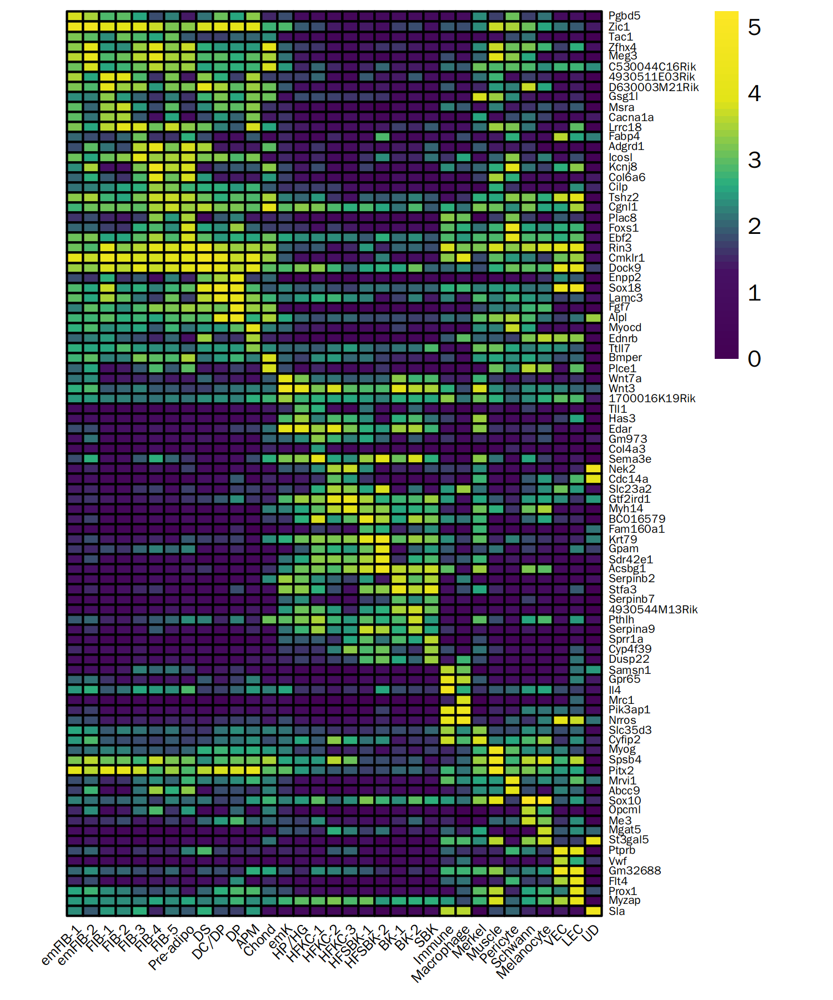

In [64]:
# Custom function to create italicized labels
custom_italics <- function(labels) {
  sapply(labels, function(label) as.expression(bquote(italic(.(label)))))
}

# Generate the heatmap with properly italicized row labels
heatmap_grob <- pheatmap(
  forplot3,
  #color = hcl.colors(50, "inferno"), 
  color = colorRampPalette(c("#440154ff", "#471164ff", "#27ad81ff", "#e3e418ff", "#fde725ff"))(50),  # Define the color palette
  cluster_rows = FALSE,  # Don't cluster rows, use the sorted order
  cluster_cols = FALSE,  # Don't cluster columns, use the custom order
  #scale = "row",         # Optionally scale the data by rows
  border_color = 'black',
  angle_col = 45,        # Rotate column labels by 45 degrees
  show_rownames = TRUE,  # Display row names
  fontsize_row = 5,     # Adjust row label font size
  fontsize_col = 6,
  cellwidth = 7,  # Adjust cell width to prevent overlap
  #breaks = seq(from=-2, to=2, length.out=50), # max and min scale bar
  labels_row = custom_italics(rownames(forplot3))  # Italicize row names
)

ggsave("./Fig4_rxiv/241108.drocsmoothe.fc1.0.heatmap.svg", plot=heatmap_grob, width =5, height =6, units = 'in')

In [66]:
figR.d <- runFigRGRN(ATAC.se = ATAC.se.paired, # Must be the same input as used in runGenePeakcorr()
                     dorcTab = cisCorr.filt, # Filtered peak-gene associations
                     genome = "mm10",
                     dorcMat = dorcMat.s,
                     dorcK = 15, # ~3% of dorc 
                     rnaMat = RNAmat.s, 
                     nCores = 12)

Assuming peak indices in Peak field

Removing genes with 0 expression across cells ..




Getting peak x motif matches ..
Determining background peaks ..
Using  50  iterations ..

Testing  678  TFs
Testing  648  DORCs


Running FigR using 12 cores ..




  |======================================================================| 100%Finished!
Merging results ..


In [67]:
#write.csv(figR.d, "241210.figR.d.csv", row.names = FALSE)

In [68]:
options(repr.plot.width = 5, repr.plot.height = 5, repr.plot.res = 600)

Scale for y is already present.
Adding another scale for y, which will replace the existing scale.
Scale for x is already present.
Adding another scale for x, which will replace the existing scale.


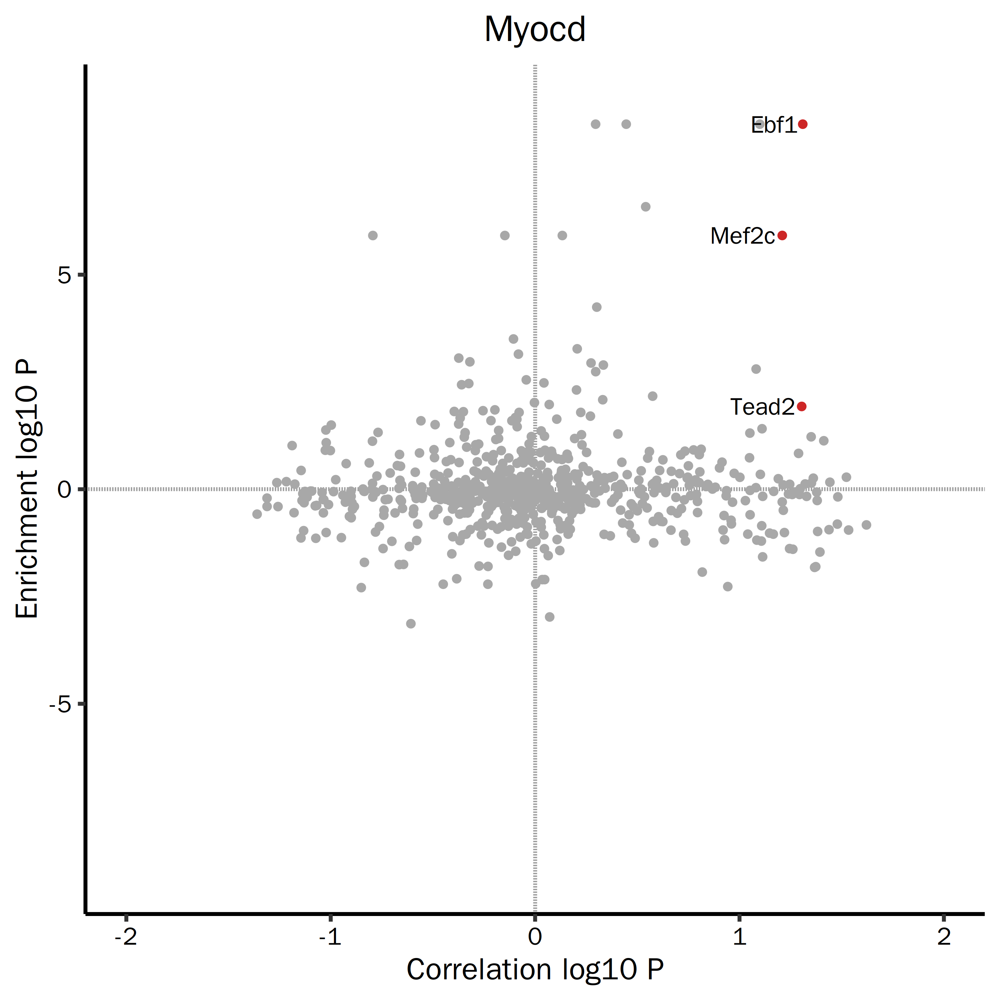

In [69]:
plotDrivers(figR.d,score.cut = 1.2,marker = "Myocd")
ggsave("./Fig4_rxiv/241112.myocd.svg", width =3, height =3, units = 'in')

Scale for y is already present.
Adding another scale for y, which will replace the existing scale.
Scale for x is already present.
Adding another scale for x, which will replace the existing scale.


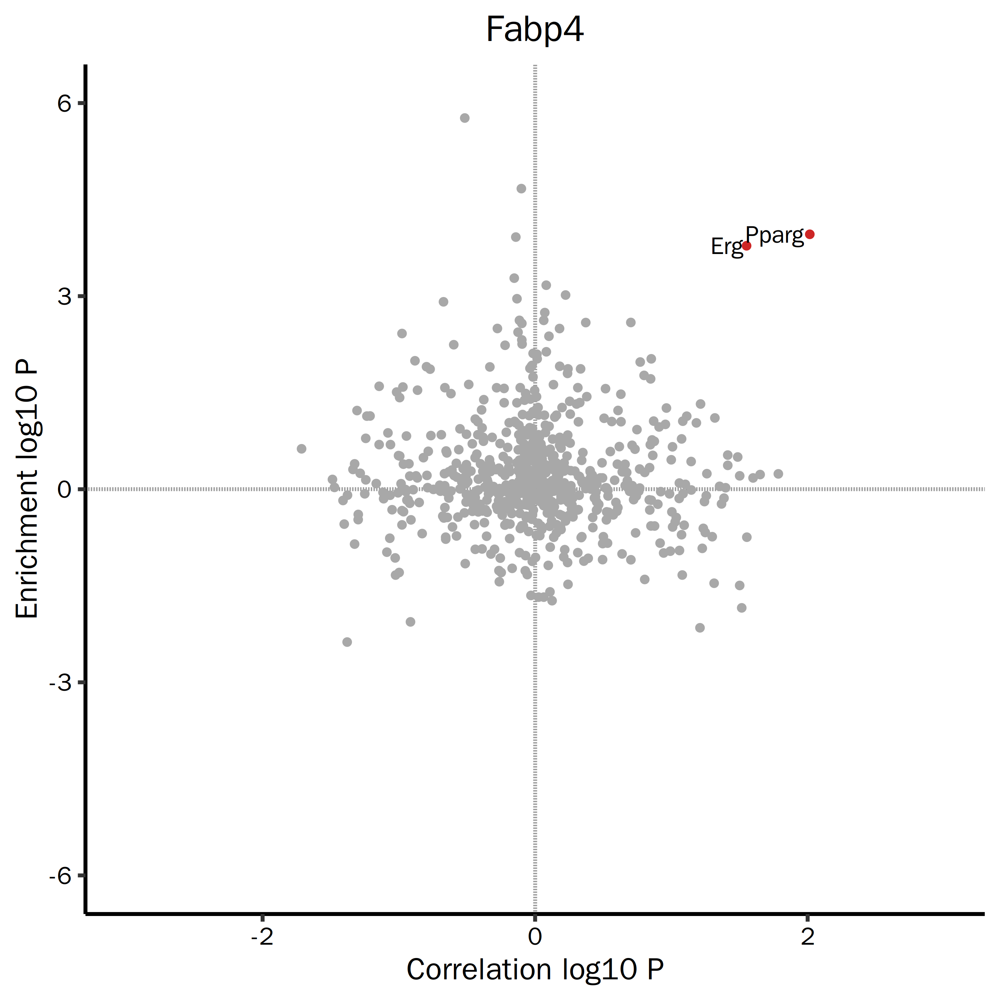

In [70]:
plotDrivers(figR.d,score.cut = 1.2,marker = "Fabp4")
ggsave("./Fig4_rxiv/241112.fabp4.svg", width =3, height =3, units = 'in')

Scale for y is already present.
Adding another scale for y, which will replace the existing scale.
Scale for x is already present.
Adding another scale for x, which will replace the existing scale.


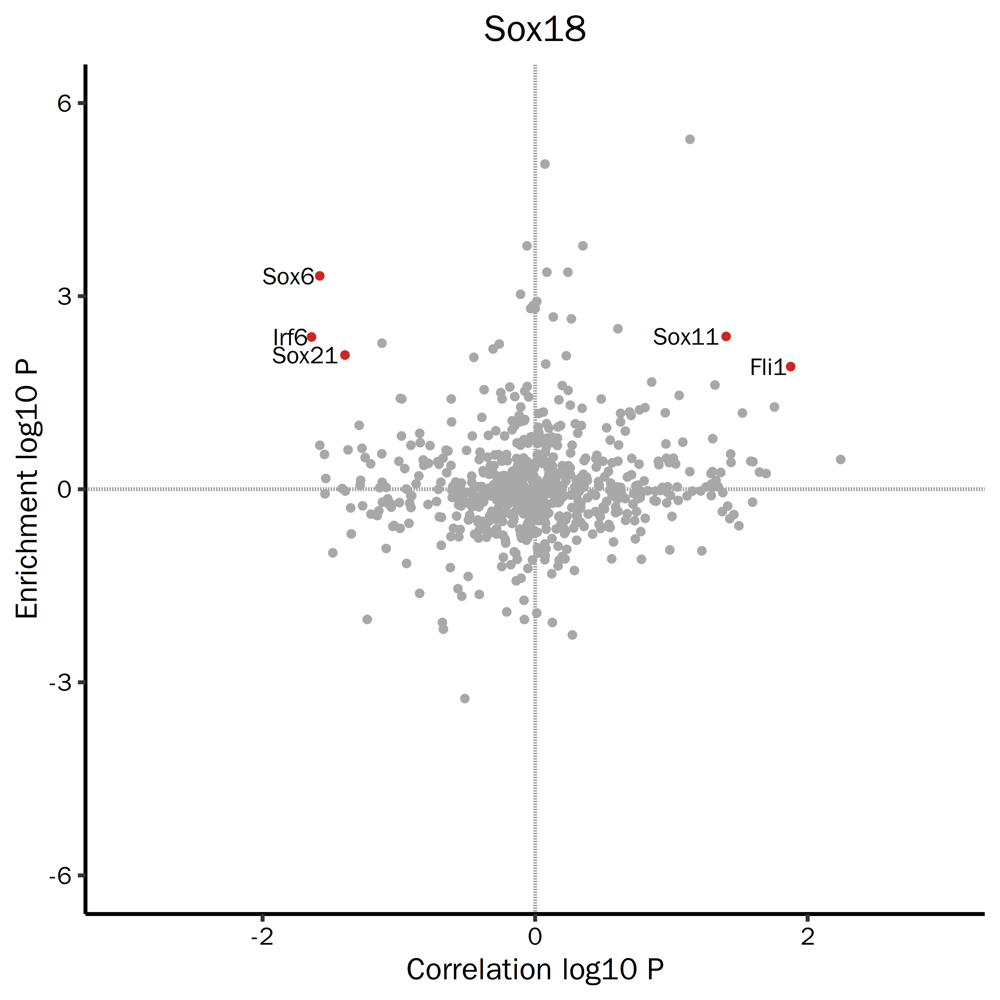

In [71]:
plotDrivers(figR.d,score.cut = 1.2,marker = "Sox18")
ggsave("./Fig4_rxiv/241112.sox18.svg", width =3, height =3, units = 'in')

Scale for y is already present.
Adding another scale for y, which will replace the existing scale.
Scale for x is already present.
Adding another scale for x, which will replace the existing scale.


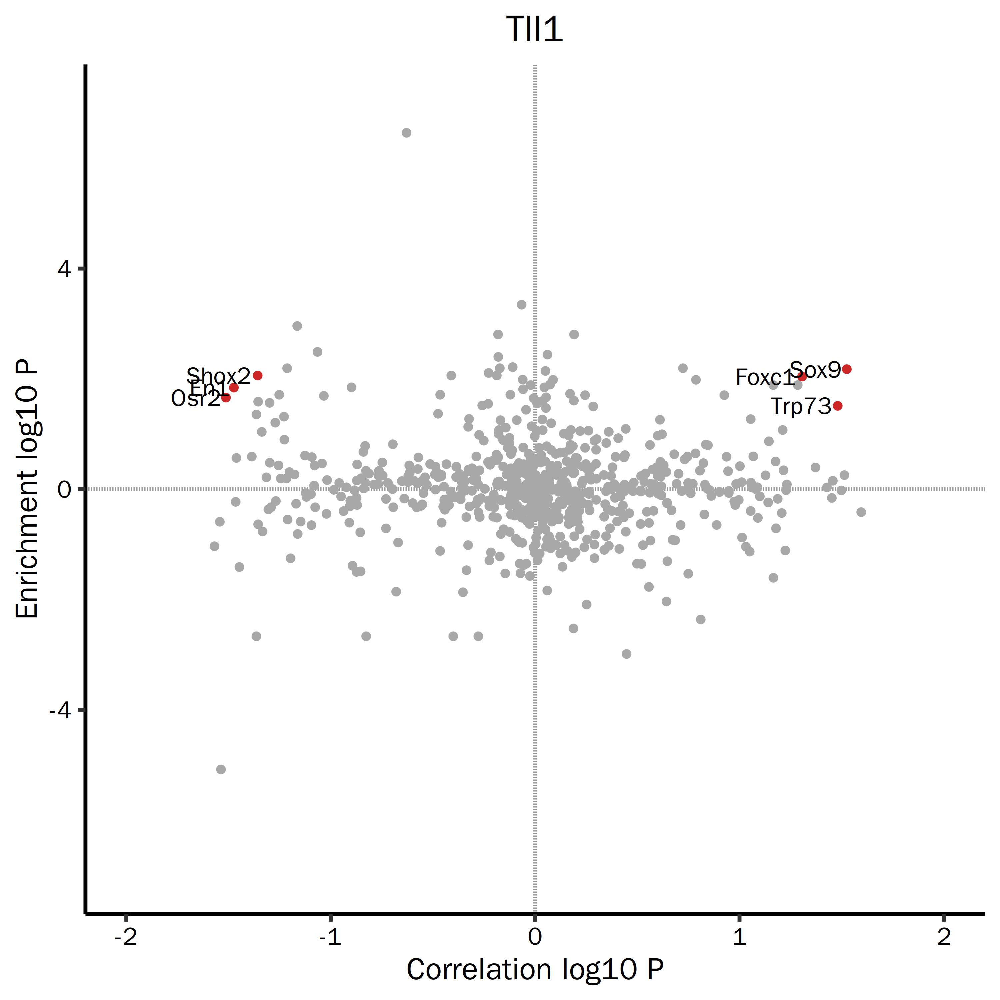

In [72]:
plotDrivers(figR.d,score.cut = 1.2,marker = "Tll1")
ggsave("./Fig4_rxiv/241112.tll1.svg", width =3, height =3, units = 'in')

Scale for y is already present.
Adding another scale for y, which will replace the existing scale.
Scale for x is already present.
Adding another scale for x, which will replace the existing scale.


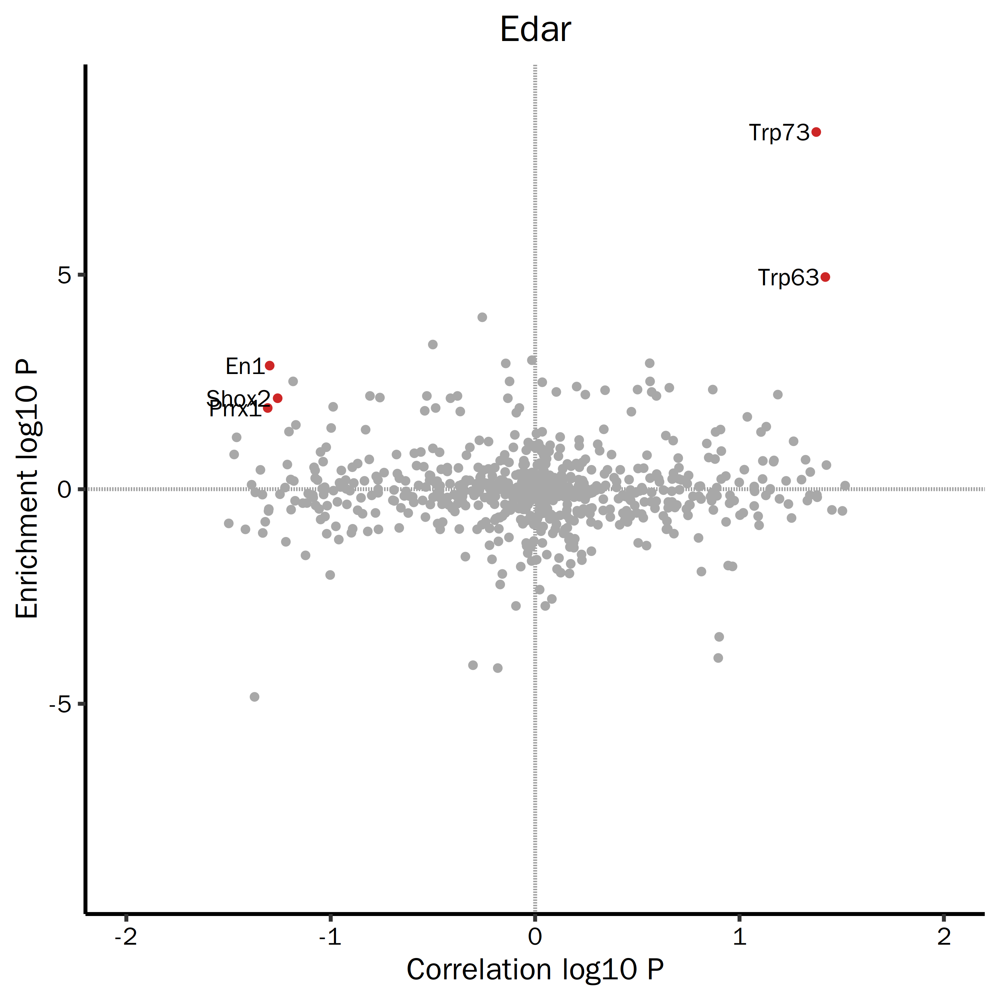

In [73]:
plotDrivers(figR.d,score.cut = 1.2,marker = "Edar")
ggsave("./Fig4_rxiv/241112.edar.svg", width =3, height =3, units = 'in')

Scale for y is already present.
Adding another scale for y, which will replace the existing scale.
Scale for x is already present.
Adding another scale for x, which will replace the existing scale.


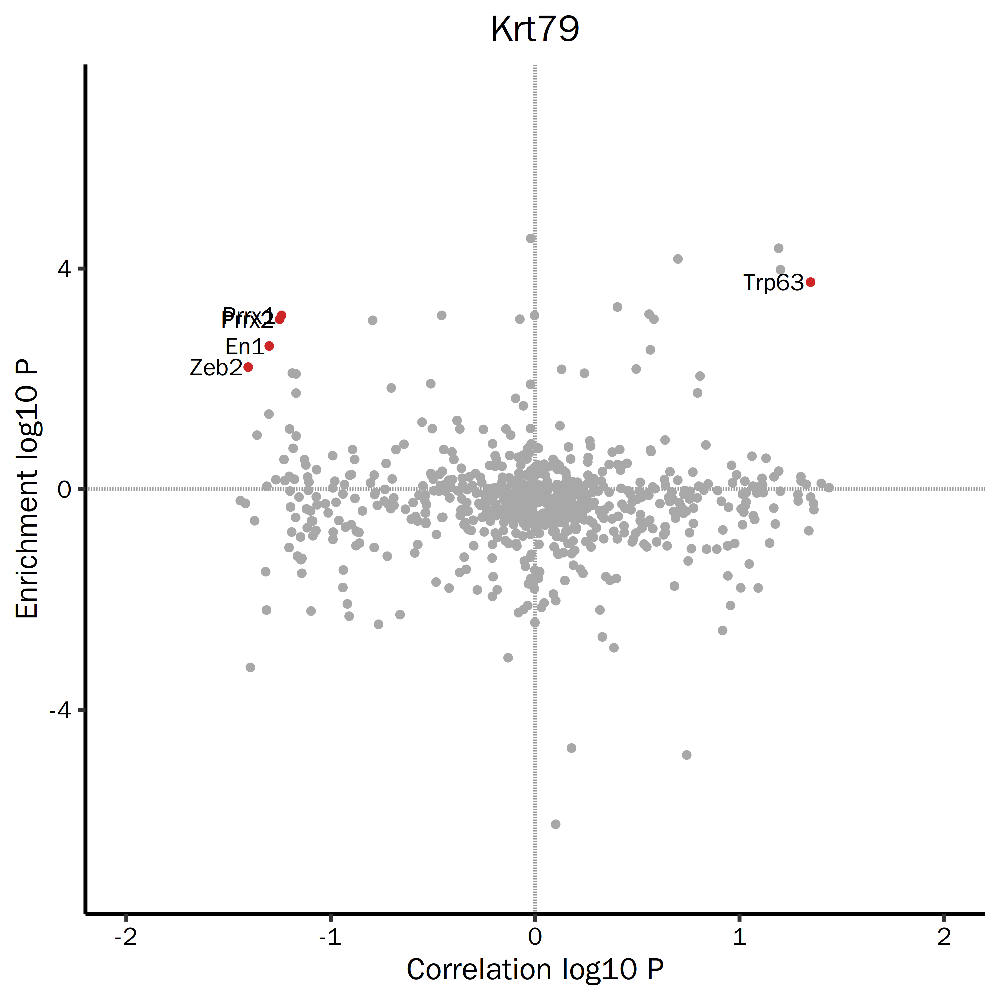

In [74]:
plotDrivers(figR.d,score.cut = 1.2,marker = "Krt79")
ggsave("./Fig4_rxiv/241112.krt79.svg", width =3, height =3, units = 'in')